In [160]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns

import os

<h1> Data Import </h1>

In [161]:
# Data import

features = pd.read_csv('D:/Data Science/Walmart Forecasting/data/features.csv')
train = pd.read_csv('D:\Data Science\Walmart Forecasting\data/train.csv')
test = pd.read_csv('D:/Data Science/Walmart Forecasting/data/test.csv')
stores = pd.read_csv('D:/Data Science/Walmart Forecasting/data/stores.csv')

sample_submission = pd.read_csv('D:/Data Science/Walmart Forecasting/data/sampleSubmission.csv')

<h1> Basic Data Adjustments </h1>

In [162]:
# Converte Date column to datetime type

features['Date'] = pd.to_datetime(features['Date'])
train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

# Add datetime features

features['Day'] = features['Date'].dt.day
features['Week'] = features['Date'].dt.isocalendar().week
features['Month'] = features['Date'].dt.month
features['Year'] = features['Date'].dt.year


In [164]:
feature_store = features.merge(stores, how = 'inner', on = 'Store')

feature_store

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Day,Week,Month,Year,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,5,5,2,2010,A,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,12,6,2,2010,A,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,19,7,2,2010,A,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,26,8,2,2010,A,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,5,9,3,2010,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False,28,26,6,2013,B,118221
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False,5,27,7,2013,B,118221
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False,12,28,7,2013,B,118221
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False,19,29,7,2013,B,118221


In [165]:
train_df = train.merge(feature_store, how='inner', on=['Store', 'Date', 'IsHoliday'])\
                      .sort_values(by=['Store', 'Dept','Date']).reset_index(drop=True)

train_df

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Day,Week,Month,Year,Type,Size
0,1,1,2010-02-05,24924.50,False,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,5,5,2,2010,A,151315
1,1,1,2010-02-12,46039.49,True,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,12,6,2,2010,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,19,7,2,2010,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,26,8,2,2010,A,151315
4,1,1,2010-03-05,21827.90,False,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,5,9,3,2010,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,False,64.88,3.997,4556.61,20.64,1.50,1601.01,3288.25,192.013558,8.684,28,39,9,2012,B,118221
421566,45,98,2012-10-05,628.10,False,64.89,3.985,5046.74,NaN,18.82,2253.43,2340.01,192.170412,8.667,5,40,10,2012,B,118221
421567,45,98,2012-10-12,1061.02,False,54.47,4.000,1956.28,NaN,7.89,599.32,3990.54,192.327265,8.667,12,41,10,2012,B,118221
421568,45,98,2012-10-19,760.01,False,56.47,3.969,2004.02,NaN,3.18,437.73,1537.49,192.330854,8.667,19,42,10,2012,B,118221


In [166]:
test_df = test.merge(feature_store, how='inner', on=['Store', 'Date', 'IsHoliday'])\
                    .sort_values(by=['Store', 'Dept','Date']).reset_index(drop=True)

test_df

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Day,Week,Month,Year,Type,Size
0,1,1,2012-11-02,False,55.32,3.386,6766.44,5147.70,50.82,3639.90,2737.42,223.462779,6.573,2,44,11,2012,A,151315
1,1,1,2012-11-09,False,61.24,3.314,11421.32,3370.89,40.28,4646.79,6154.16,223.481307,6.573,9,45,11,2012,A,151315
2,1,1,2012-11-16,False,52.92,3.252,9696.28,292.10,103.78,1133.15,6612.69,223.512911,6.573,16,46,11,2012,A,151315
3,1,1,2012-11-23,True,56.23,3.211,883.59,4.17,74910.32,209.91,303.32,223.561947,6.573,23,47,11,2012,A,151315
4,1,1,2012-11-30,False,52.34,3.207,2460.03,NaN,3838.35,150.57,6966.34,223.610984,6.573,30,48,11,2012,A,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115059,45,98,2013-06-28,False,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,28,26,6,2013,B,118221
115060,45,98,2013-07-05,False,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,5,27,7,2013,B,118221
115061,45,98,2013-07-12,False,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,12,28,7,2013,B,118221
115062,45,98,2013-07-19,False,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,19,29,7,2013,B,118221


In [167]:
# Create a week-grouped dataset so we can evaluate metrics weekly

df_weeks = train_df.groupby('Week').sum()
df_weeks

C:\Users\Plínio\AppData\Local\Temp\ipykernel_12980\1626634781.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Day,Month,Year,Size
Week,,,,,,,,,,,,,,,,,
1,130899,260501,8.773121e+07,0,222343.25,18872.529,1.499397e+07,6.700739e+07,3.534867e+05,3078155.61,15506769.87,1.008962e+06,46396.361,38348,5903,11873906,806775433
2,131036,260045,8.269676e+07,0,204005.74,19098.337,1.019858e+07,2.923531e+07,2.185133e+05,1565390.83,11416226.10,1.007821e+06,46330.934,79550,5894,11855800,805424262
3,130031,259381,8.273564e+07,0,222547.92,19167.202,7.210967e+06,9.824350e+06,2.140790e+05,1942054.54,8410008.53,1.006852e+06,46151.605,120458,5877,11821606,804330161
4,129971,259111,7.943483e+07,0,221326.56,19229.283,4.418107e+06,5.170161e+06,2.132158e+05,296603.35,7927497.89,1.006330e+06,46135.250,161436,5871,11809533,803454747
5,195904,392036,1.419895e+08,0,317172.19,27489.729,1.140734e+08,8.936033e+06,4.485532e+05,90821661.61,18580144.27,1.507341e+06,71739.976,35410,17716,17813460,1213767653
6,196850,394786,1.456823e+08,8895,308692.32,27771.111,3.388102e+07,1.374891e+07,2.230950e+05,28678531.29,18188378.72,1.514441e+06,71962.692,97800,17790,17887890,1219143417
7,197602,396508,1.471902e+08,0,362493.21,28048.496,3.491820e+07,2.495659e+07,5.532842e+04,19735801.65,18139157.65,1.520852e+06,72321.353,160692,17858,17956249,1221309371
8,195853,390108,1.338659e+08,0,369896.71,28063.010,2.793795e+07,1.755367e+07,1.337054e+04,8544934.40,17424405.80,1.507838e+06,71597.140,221090,17688,17785294,1210785752
9,197097,393893,1.407131e+08,0,388853.51,29131.976,4.981556e+07,4.794496e+06,8.514402e+04,34262956.69,10572056.03,1.517037e+06,71990.147,32532,26676,17881858,1217495757


<h1> EDA </h1>

In [168]:
train_df.describe().T.style\
                        .bar(subset= ['mean'], color='#205ff2')\
                        .background_gradient(subset=['std'],cmap='inferno')\
                        .background_gradient(subset=['50%'],cmap='inferno')

,count,mean,std,min,25%,50%,75%,max
Store,421570.000000,22.200546,12.785297,1.000000,11.000000,22.000000,33.000000,45.000000
Dept,421570.000000,44.260317,30.492054,1.000000,18.000000,37.000000,74.000000,99.000000
Weekly_Sales,421570.000000,15981.258123,22711.183519,-4988.940000,2079.650000,7612.030000,20205.852500,693099.360000
Temperature,421570.000000,60.090059,18.447931,-2.060000,46.680000,62.090000,74.280000,100.140000
Fuel_Price,421570.000000,3.361027,0.458515,2.472000,2.933000,3.452000,3.738000,4.468000
MarkDown1,150681.000000,7246.420196,8291.221345,0.270000,2240.270000,5347.450000,9210.900000,88646.760000
MarkDown2,111248.000000,3334.628621,9475.357325,-265.760000,41.600000,192.000000,1926.940000,104519.540000
MarkDown3,137091.000000,1439.421384,9623.078290,-29.100000,5.080000,24.600000,103.990000,141630.610000
MarkDown4,134967.000000,3383.168256,6292.384031,0.220000,504.220000,1481.310000,3595.040000,67474.850000
MarkDown5,151432.000000,4628.975079,5962.887455,135.160000,1878.440000,3359.450000,5563.800000,108519.280000


In [169]:
px.line(data_frame=df_weeks, x = df_weeks.index, y = df_weeks['Weekly_Sales'])

queda repentina na semana 44

In [170]:
# Merge datasets on stores

dataset = train.merge(stores, how='left').merge(features, how='left')

dataset.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Day,Week,Month,Year
0,1,1,2010-02-05,24924.50,False,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,5,5,2,2010
1,1,1,2010-02-12,46039.49,True,A,151315,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,12,6,2,2010
2,1,1,2010-02-19,41595.55,False,A,151315,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,19,7,2,2010
3,1,1,2010-02-26,19403.54,False,A,151315,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,26,8,2,2010
4,1,1,2010-03-05,21827.90,False,A,151315,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,5,9,3,2010


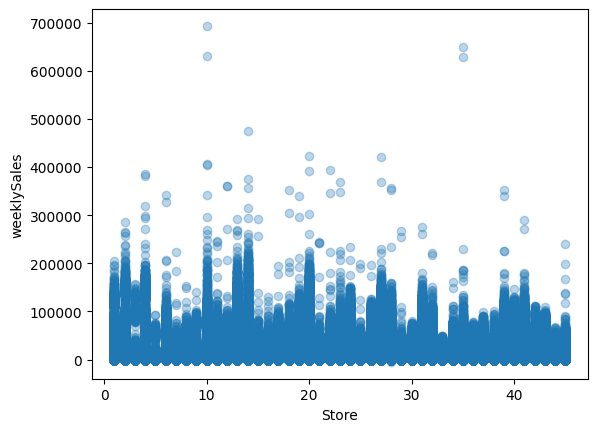

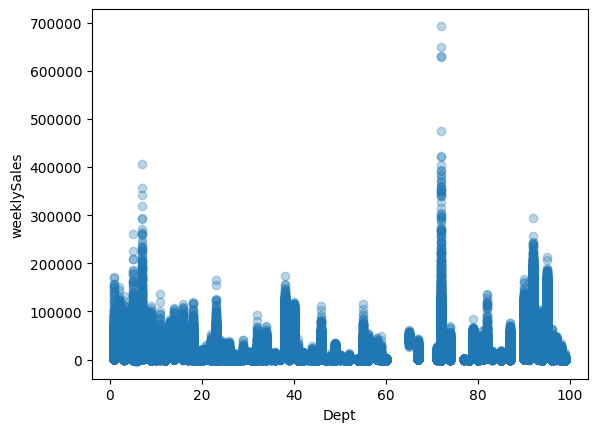

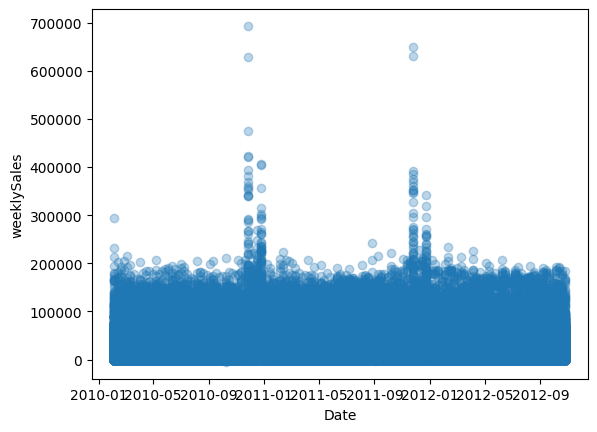

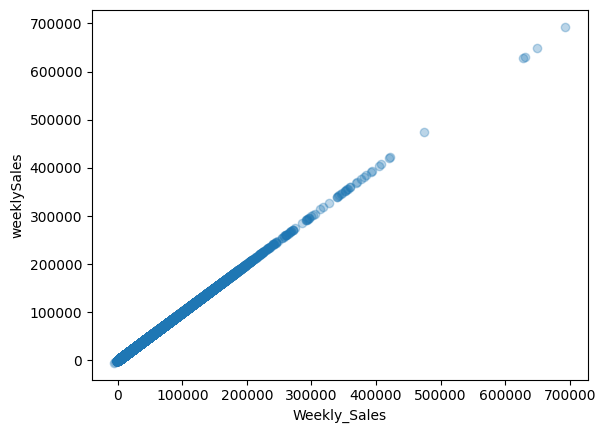

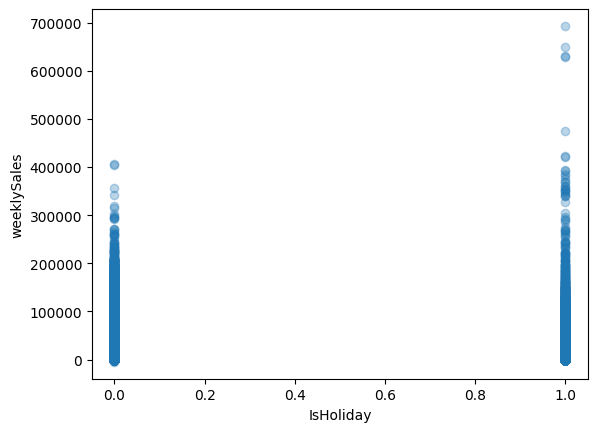

...

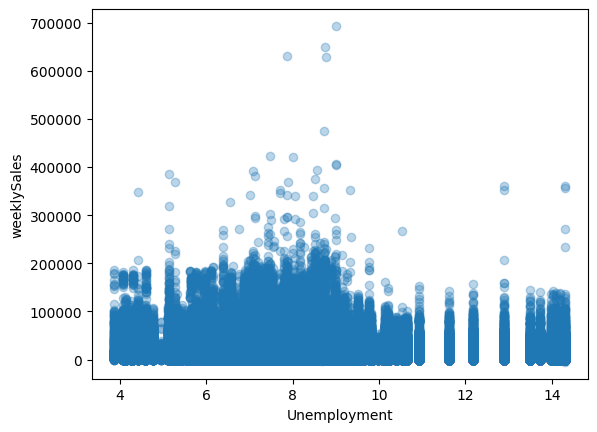

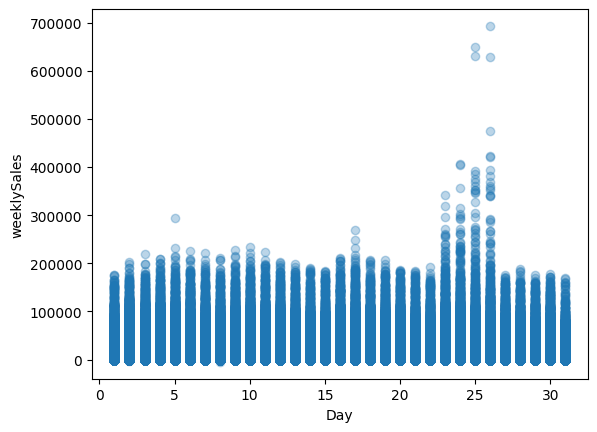

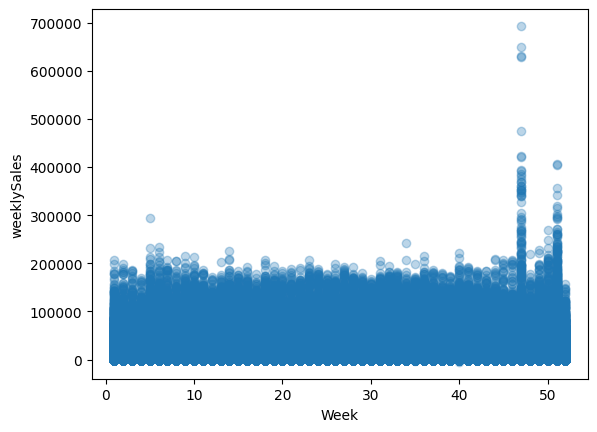

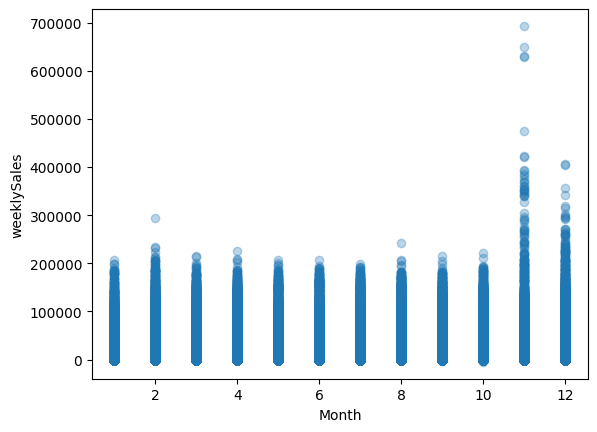

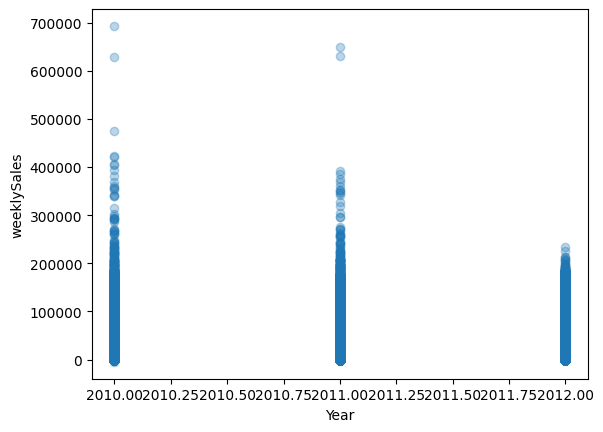

In [171]:
# Create scatter plots to check variables vs Weekly sales
for i in dataset.columns:
    plt.figure()
    plt.scatter(dataset[i], dataset['Weekly_Sales'], cmap='inferno', alpha=0.3)
    plt.ylabel('weeklySales')
    plt.xlabel(f'{i}')
    

In [172]:
# Weekly sales

px.line(data_frame = dataset, x = dataset.index, y = 'Weekly_Sales', 
        labels = {'Weekly_Sales' : 'Weekly Sales', 'x' : 'Weeks' }, 
        title = 'Sales over weeks')

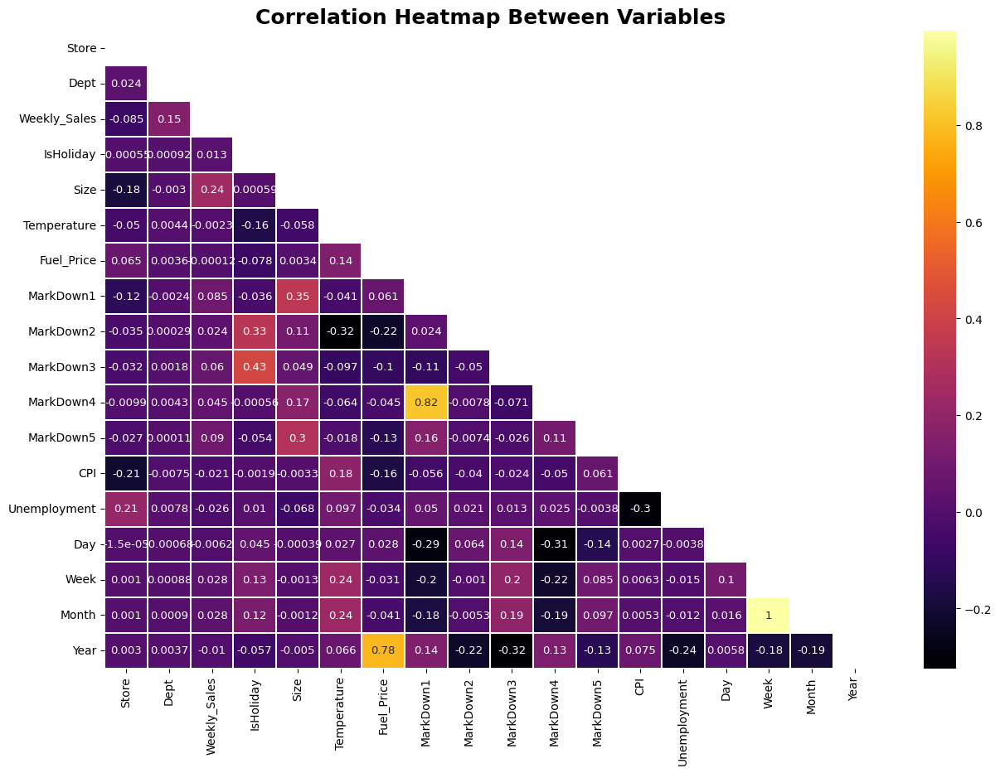

In [173]:
# Check correlations between variables

corr = dataset.corr(numeric_only = True)
mask = np.triu(np.ones_like(corr,dtype=bool)) # hides the top part of the heatmap

# Plot
fig = plt.figure(figsize= (15,10))
sns.heatmap(corr, 
            cmap = 'inferno',
            mask = mask,
            annot = True,
            linewidth = 0.1,
            cbar = True,
            annot_kws={'size':9.5})

plt.title('Correlation Heatmap Between Variables', 
          fontweight = 'heavy', 
          ha = 'center', 
          fontsize = 18)

plt.show()

In [174]:

dataset = pd.get_dummies(dataset)

# Fill nulls in MarkDown Variables
dataset[['MarkDown1','MarkDown2','MarkDown3','MarkDown4', 'MarkDown5']] = dataset[['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']].fillna(0)

# Change Variable 'Month' to datetime
dataset['Month'] = pd.to_datetime(dataset['Date']).dt.month

dataset

,Store,Dept,Date,Weekly_Sales,IsHoliday,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,...,MarkDown5,CPI,Unemployment,Day,Week,Month,Year,Type_A,Type_B,Type_C
0,1,1,2010-02-05,24924.50,False,151315,42.31,2.572,0.00,0.00,...,0.00,211.096358,8.106,5,5,2,2010,1,0,0
1,1,1,2010-02-12,46039.49,True,151315,38.51,2.548,0.00,0.00,...,0.00,211.242170,8.106,12,6,2,2010,1,0,0
2,1,1,2010-02-19,41595.55,False,151315,39.93,2.514,0.00,0.00,...,0.00,211.289143,8.106,19,7,2,2010,1,0,0
3,1,1,2010-02-26,19403.54,False,151315,46.63,2.561,0.00,0.00,...,0.00,211.319643,8.106,26,8,2,2010,1,0,0
4,1,1,2010-03-05,21827.90,False,151315,46.50,2.625,0.00,0.00,...,0.00,211.350143,8.106,5,9,3,2010,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,False,118221,64.88,3.997,4556.61,20.64,...,3288.25,192.013558,8.684,28,39,9,2012,0,1,0
421566,45,98,2012-10-05,628.10,False,118221,64.89,3.985,5046.74,0.00,...,2340.01,192.170412,8.667,5,40,10,2012,0,1,0
421567,45,98,2012-10-12,1061.02,False,118221,54.47,4.000,1956.28,0.00,...,3990.54,192.327265,8.667,12,41,10,2012,0,1,0
421568,45,98,2012-10-19,760.01,False,118221,56.47,3.969,2004.02,0.00,...,1537.49,192.330854,8.667,19,42,10,2012,0,1,0
